# Feature Analysis: What Do the Models Learn?

In addition to implementing the PatchCraft model itself, we wanted to look deeper at *why* this model in particular was so effective at differentiating between real and AI-generated images. We wanted to see whether or not fingerprint extraction made a significant difference in this classification task. To gain a better understanding of how the models learned, we produced visualizations to see what features the models were learning. We compared three different models: the fingerprint extraction model, a ResNet model fine-tuned on real vs AI image classification, and a hybrid model. The hybrid model has 31 input channels into the neural network: 30 that are the filters from the fingerprint model, and one that is the original image.

Throughout the code in this notebook, you will see that all of this analysis can be performed with real or synthetic data. We used synthetic data early on in our project as a proof of concept and for simplicity. However, using real images is what actually shows what the models are learning.

## Setup

In [1]:
import os
import glob
from pathlib import Path
from typing import Tuple

import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as T

import matplotlib.pyplot as plt
from PIL import Image

In [2]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [3]:
DATA_ROOT_CANDIDATES = [
    r"data/datasets/anhphmminh/cnnspot/versions/1/cnn_spot/train",
    r"../data/datasets/anhphmminh/cnnspot/versions/1/cnn_spot/train",
    r"../notebooks/data/datasets/anhphmminh/cnnspot/versions/1/cnn_spot/train",
    r"notebooks/data/datasets/anhphmminh/cnnspot/versions/1/cnn_spot/train",
]
DATA_ROOT = next((p for p in DATA_ROOT_CANDIDATES if Path(p).exists()), DATA_ROOT_CANDIDATES[0])

def load_sample_images(root=None):
    root = root or DATA_ROOT
    # Find one real and one fake image
    real_paths = list(Path(root).rglob("0_real/*.*"))
    fake_paths = list(Path(root).rglob("1_fake/*.*"))
    ok = {".jpg", ".jpeg", ".png"}
    real_paths = [p for p in real_paths if p.suffix.lower() in ok]
    fake_paths = [p for p in fake_paths if p.suffix.lower() in ok]

    if not real_paths or not fake_paths:
        return None, None
    return str(real_paths[0]), str(fake_paths[0])

def load_batch(pattern, root=None, limit=32):
    # Load a batch of real or fake images (pattern = '0_real' or '1_fake')
    root = root or DATA_ROOT
    ok = {".jpg", ".jpeg", ".png"}
    paths = list(Path(root).rglob(f"{pattern}/*.*"))
    paths = [p for p in paths if p.suffix.lower() in ok][:limit]
    if not paths:
        return None
    tensors = []
    for p in paths:
        img = Image.open(p).convert("RGB").resize((256, 256), Image.Resampling.LANCZOS)
        arr = np.array(img).astype(np.float32) / 255.0
        tensors.append(torch.from_numpy(arr.transpose(2, 0, 1)))
    return torch.stack(tensors).to(DEVICE)

real_p, fake_p = load_sample_images()

### Model definitions (identical to other Juptyer notebook)

In [4]:
class SRMFilters(nn.Module):
    """30 hardcoded SRM high-pass filters."""
    def __init__(self):
        super().__init__()
        kernels = [
            torch.tensor([[0,0,0,0,0],[0,0,1,0,0],[0,0,-1,0,0],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,1,0],[0,0,-1,0,0],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,0,-1,1,0],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,0,-1,0,0],[0,0,0,1,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,0,-1,0,0],[0,0,1,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,0,-1,0,0],[0,1,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,1,-1,0,0],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,1,0,0,0],[0,0,-1,0,0],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,-1,0,0],[0,0,3,0,0],[0,0,-3,0,0],[0,0,1,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,-1],[0,0,0,3,0],[0,0,-3,0,0],[0,1,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,1,-3,3,-1],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,1,0,0,0],[0,0,-3,0,0],[0,0,0,3,0],[0,0,0,0,-1]], dtype=torch.float32),
            torch.tensor([[0,0,1,0,0],[0,0,0,0,0],[0,0,-3,0,0],[0,0,3,0,0],[0,0,-1,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,1],[0,0,0,0,0],[0,0,-3,0,0],[0,3,0,0,0],[-1,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[-1,3,-3,0,1],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[-1,0,0,0,0],[0,3,0,0,0],[0,0,-3,0,0],[0,0,0,0,0],[0,0,0,0,1]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,1,0,0],[0,0,-2,0,0],[0,0,1,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,1,-2,1,0],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,1,0],[0,0,-2,0,0],[0,1,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,1,0,0,0],[0,0,-2,0,0],[0,0,0,1,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,-1,2,-1,0],[0,2,-4,2,0],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,2,-1,0],[0,0,-4,2,0],[0,0,2,-1,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,2,-4,2,0],[0,-1,2,-1,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,-1,2,0,0],[0,2,-4,0,0],[0,-1,2,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[-1,2,-2,2,-1],[2,-6,8,-6,2],[-2,8,-12,8,-2],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,-2,2,-1],[0,0,8,-6,2],[0,0,-12,8,-2],[0,0,8,-6,2],[0,0,-2,2,-1]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[-2,8,-12,8,-2],[2,-6,8,-6,2],[-1,2,-2,2,-1]], dtype=torch.float32),
            torch.tensor([[-1,2,-2,0,0],[2,-6,8,0,0],[-2,8,-12,0,0],[2,-6,8,0,0],[-1,2,-2,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,-1,2,-1,0],[0,2,-4,2,0],[0,-1,2,-1,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[-1,2,-2,2,-1],[2,-6,8,-6,2],[-2,8,-12,8,-2],[2,-6,8,-6,2],[-1,2,-2,2,-1]], dtype=torch.float32),
        ]
        kernels = torch.stack(kernels).unsqueeze(1)  # [30, 1, 5, 5]
        self.register_buffer("kernels", kernels)

    def forward(self, x):
        if x.shape[1] == 3:
            x = 0.299 * x[:, 0:1] + 0.587 * x[:, 1:2] + 0.114 * x[:, 2:3]
        return torch.nn.functional.conv2d(x, self.kernels, padding=2)


class LearnableSRMFilters(nn.Module):
    """Same shape as SRMFilters but kernels are trainable."""
    def __init__(self, num_filters=30, init_from_srm=True):
        super().__init__()
        self.conv = nn.Conv2d(1, num_filters, kernel_size=5, padding=2, bias=False)
        if init_from_srm:
            with torch.no_grad():
                self.conv.weight.copy_(SRMFilters().kernels)

    def forward(self, x):
        if x.shape[1] == 3:
            x = 0.299 * x[:, 0:1] + 0.587 * x[:, 1:2] + 0.114 * x[:, 2:3]
        return self.conv(x)

In [5]:
def smash(img, patch_size: int = 32, num_patches: int = 192, diversity_threshold: float = 0.33) -> Tuple[torch.Tensor, torch.Tensor]:
    """Identical to the production smash() in notebook.ipynb."""
    if isinstance(img, Image.Image):
        to_tensor = T.ToTensor()
        img_tensor = to_tensor(img).unsqueeze(0).to(DEVICE)
    else:
        img_tensor = img.to(DEVICE)

    B, C, H, W = img_tensor.shape

    unfold = F.unfold(img_tensor, kernel_size=patch_size, stride=patch_size // 2)
    patches = unfold.view(B, C, patch_size, patch_size, -1).permute(0, 4, 1, 2, 3)

    if patches.shape[1] > num_patches:
        patches = torch.stack([
            patches[b, torch.randperm(patches.shape[1], device=DEVICE)[:num_patches]]
            for b in range(B)
        ])

    d1 = torch.abs(patches[:, :, :, 1:, :] - patches[:, :, :, :-1, :]).sum(dim=[2, 3, 4])
    d2 = torch.abs(patches[:, :, :, :, 1:] - patches[:, :, :, :, :-1]).sum(dim=[2, 3, 4])
    d3 = torch.abs(patches[:, :, :, 1:, 1:] - patches[:, :, :, :-1, :-1]).sum(dim=[2, 3, 4])
    d4 = torch.abs(patches[:, :, :, 1:, :-1] - patches[:, :, :, :-1, 1:]).sum(dim=[2, 3, 4])
    diversity_scores = (d1 + d2 + d3 + d4) / 4.0

    rich_list, poor_list = [], []
    num_select = int(num_patches * diversity_threshold)
    num_select += 1 if num_select % 2 == 1 else 0

    for b in range(B):
        _, sorted_idx = torch.sort(diversity_scores[b], descending=True)
        rich_list.append(patches[b, sorted_idx[:num_select]])
        poor_list.append(patches[b, sorted_idx[-num_select:]])

    return torch.cat(rich_list, dim=0), torch.cat(poor_list, dim=0)


def reconstruct(patches: torch.Tensor, patches_per_image: int = 64) -> torch.Tensor:
    """Identical to the production reconstruct() in notebook.ipynb."""
    total = patches.shape[0]
    B = total // patches_per_image
    assert total % patches_per_image == 0, f"Got {total} patches, expected multiple of {patches_per_image}"

    patch_size = patches.shape[2]
    grid_size = 8

    patches = patches.view(B, patches_per_image, 3, patch_size, patch_size)

    collages = []
    for b in range(B):
        img_patches = patches[b].view(grid_size, grid_size, 3, patch_size, patch_size)
        rows = [torch.cat([img_patches[i, j] for j in range(grid_size)], dim=2)
                for i in range(grid_size)]
        collages.append(torch.cat(rows, dim=1))

    return torch.stack(collages)


def smash_and_reconstruct(img: torch.Tensor, num_patches: int = 192) -> Tuple[torch.Tensor, torch.Tensor]:
    """Run the full smash -> reconstruct pipeline and return (rich_collage, poor_collage)."""
    rich_p, poor_p = smash(img, num_patches=num_patches)
    rich_c = reconstruct(rich_p, patches_per_image=64).to(DEVICE)
    poor_c = reconstruct(poor_p, patches_per_image=64).to(DEVICE)
    return rich_c, poor_c

### Load trained classifier checkpoints

In [6]:
possible_roots = [
    Path("./models"),
    Path("../models"),
    Path("../notebooks/models"),
    Path("notebooks/models"),
    Path("."),
    Path("./notebooks"),
    Path(".."),
]

CKPT_ROOT = None
for root in possible_roots:
    if (root / "fingerprint_only").exists() or (root / "image_only").exists():
        CKPT_ROOT = root
        break

if CKPT_ROOT is None:
    raise FileNotFoundError("No model checkpoints found. See output above.")

# Now load the checkpoints
MODE_IN_CHANNELS = {"image_only": 3, "fingerprint_only": 30, "hybrid": 33}

def find_checkpoints():
    out = {}
    for mode in MODE_IN_CHANNELS:
        d = CKPT_ROOT / mode
        if not d.exists():
            continue
        epochs = sorted(
            [p for p in d.glob("epoch_*.pth")],
            key=lambda p: int(p.stem.split("_")[1]),
        )
        if epochs:
            out[mode] = epochs
    return out

CHECKPOINTS = find_checkpoints()

fixed_filters = SRMFilters().to(DEVICE).eval()

## Hardcoded SRM Kernels

The PatchCraft model uses 30 predefined hard-coded convolutional filters on the reconstructed images. As explained previously, the purpose of these filters are for the model to detect patterns related to the inter-pixel correlation of the images. The reason why these filters were chosen in particular is because empirically they seemed to cause the model to learn well. Another reason is that they are specific filters are known to perform well in the field of steganalysis, or finding hidden messages in images that are invisible to the naked eye.

The visualization below shows which 30 filters were selected, with red pixels representing positive values and blue pixels representing negative ones. As can be seen, the weights detect different patterns within the neighborhood of each pixel.

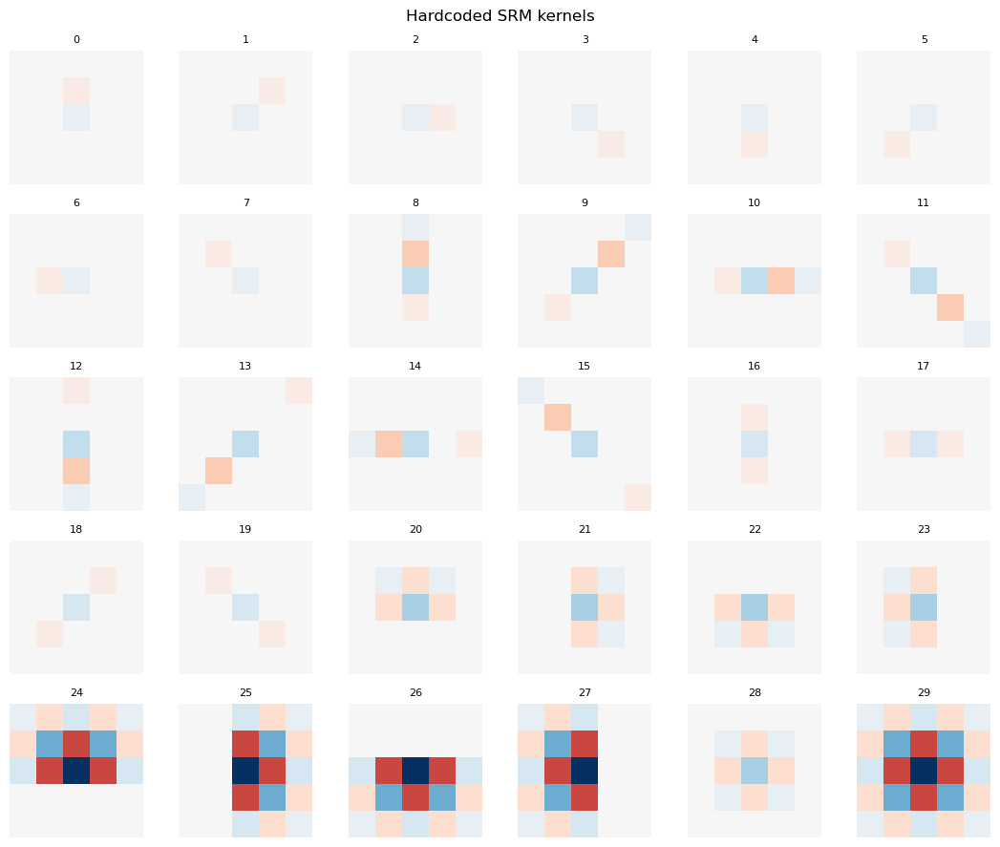

In [ ]:
def plot_kernels(weight, title, cols=6):
    w = weight.detach().cpu().squeeze(1).numpy()
    n = len(w)
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 1.8, rows * 1.8))
    axes = np.array(axes).reshape(rows, cols)
    vmax = max(np.abs(w).max(), 1e-6)
    for i in range(rows * cols):
        ax = axes[i // cols, i % cols]
        if i < n:
            ax.imshow(w[i], cmap="RdBu_r", vmin=-vmax, vmax=vmax)
            ax.set_title(f"{i}", fontsize=8)
        ax.axis("off")
    fig.suptitle(title)
    plt.tight_layout()
    plt.show()

plot_kernels(fixed_filters.kernels, "Hardcoded SRM kernels")

## Activation Maps

The filter layers (hard-coded convolutional layers) of the PatchCraft model do not receive the original images as input. Rather, they receive the smash-and-reconstructed versions of the image. The smashing and reconstructing portion of the image is important because it arranges the pixels of the images in a way that allows the filters to detect patterns related to the inter-pixel correlations. It also results in two separate images that are meant to represent the poor texture regions and rich texture regions of the original image. These are what are supposed to give this specific model an advantage over a simpler, more baseline model like a fine-tuned ResNet.

The plots below visually depict the activations of some of the filters used by the model. There is a a clear difference in the activation patterns of the real images vs the fake ones, which suggests that the model really is picking up the differences that we would expect it to.

In [8]:
def to_tensor(img, size=256):
    img = img.convert("RGB").resize((size, size), Image.Resampling.LANCZOS)
    arr = np.array(img).astype(np.float32) / 255.0
    return torch.from_numpy(arr.transpose(2, 0, 1)).unsqueeze(0)

real_p, fake_p = load_sample_images()

if real_p and fake_p:
    real_img = to_tensor(Image.open(real_p)).to(DEVICE)
    fake_img = to_tensor(Image.open(fake_p)).to(DEVICE)
else:
    y, x = np.mgrid[0:256, 0:256] / 256.0
    smooth = np.stack([y, x, y * x], 0).astype(np.float32)
    noisy = smooth + np.random.RandomState(0).randn(*smooth.shape).astype(np.float32) * 0.05
    real_img = torch.from_numpy(smooth).unsqueeze(0).to(DEVICE)
    fake_img = torch.from_numpy(noisy.clip(0, 1)).unsqueeze(0).to(DEVICE)

real_rich, real_poor = smash_and_reconstruct(real_img)
fake_rich, fake_poor = smash_and_reconstruct(fake_img)

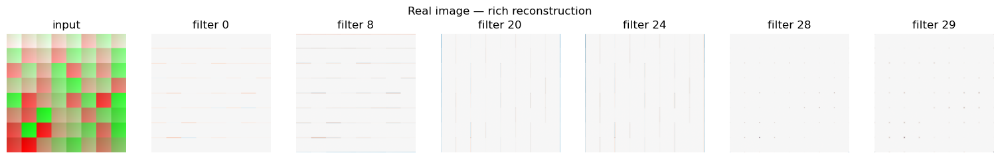

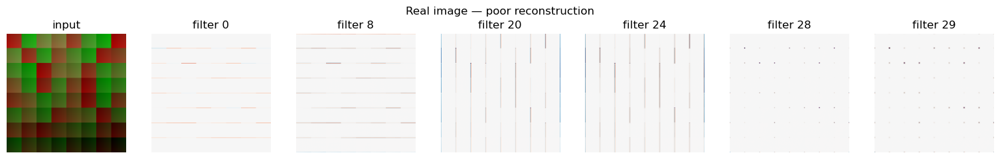

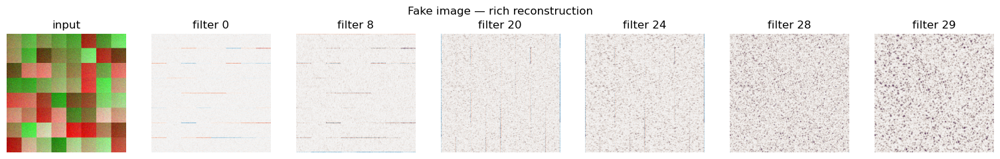

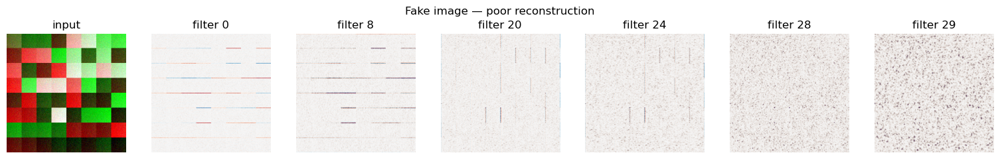

In [9]:
@torch.no_grad()
def show_activations(img, bank, title, filter_ids=(0, 8, 20, 24, 28, 29)):
    res = bank(img).cpu().squeeze(0).numpy()
    fig, axes = plt.subplots(1, len(filter_ids) + 1, figsize=(2.2 * (len(filter_ids) + 1), 2.4))
    axes[0].imshow(img.cpu().squeeze(0).permute(1, 2, 0).numpy().clip(0, 1))
    axes[0].set_title("input"); axes[0].axis("off")
    for ax, fid in zip(axes[1:], filter_ids):
        m = res[fid]
        v = max(np.abs(m).max(), 1e-6)
        ax.imshow(m, cmap="RdBu_r", vmin=-v, vmax=v)
        ax.set_title(f"filter {fid}"); ax.axis("off")
    fig.suptitle(title); plt.tight_layout(); plt.show()

show_activations(real_rich, fixed_filters, "Real image — rich reconstruction")
show_activations(real_poor, fixed_filters, "Real image — poor reconstruction")
show_activations(fake_rich, fixed_filters, "Fake image — rich reconstruction")
show_activations(fake_poor, fixed_filters, "Fake image — poor reconstruction")

## Which Filters Discriminate Real vs. Fake?

The above results show that there are differences in what the filters learn with regard to real vs AI-generated images. They do not, however, say anything about which filters are more important. The following plots show for a certain batch of images, the average difference between activations of real images vs AI-generated images.

This graph also serves as evidence that the way in which the model is learning how to distinguish between real and fake images is what we are expecting it to be. Across almost all filters, the difference between rich and poor texture regions is, on average, higher when an AI-generated image is inputted versus a real one. This means that the filters are capturing that information.

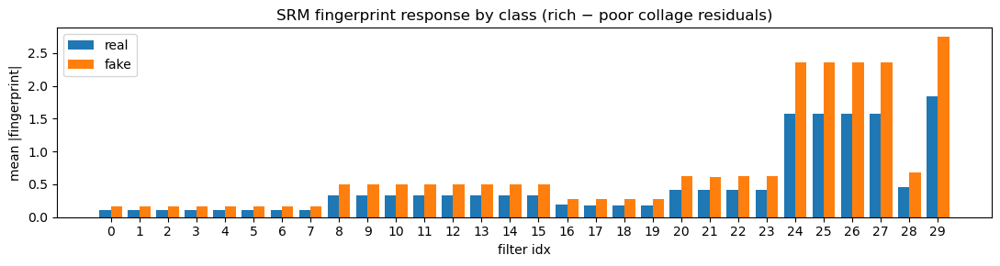

In [ ]:
@torch.no_grad()
def fingerprint_response(imgs, bank):
    # Mean |fingerprint| per SRM filter, where fingerprint = |SRM(rich) - SRM(poor)|
    rich_c, poor_c = smash_and_reconstruct(imgs)
    fp = (bank(rich_c) - bank(poor_c)).abs()   # [B, 30, H, W]
    return fp.mean(dim=(0, 2, 3)).cpu().numpy()  # [30]

real_batch = load_batch("0_real")
fake_batch = load_batch("1_fake")

if real_batch is None or fake_batch is None:
    real_batch = (torch.randn(8, 3, 256, 256, device=DEVICE) * 0.1 + 0.5).clamp(0, 1)
    fake_batch = (torch.randn(8, 3, 256, 256, device=DEVICE) * 0.15 + 0.5).clamp(0, 1)

r_resp = fingerprint_response(real_batch, fixed_filters)
f_resp = fingerprint_response(fake_batch, fixed_filters)

fig, ax = plt.subplots(figsize=(11, 3))
x = np.arange(30)
ax.bar(x - 0.2, r_resp, 0.4, label="real")
ax.bar(x + 0.2, f_resp, 0.4, label="fake")
ax.set_xticks(x); ax.set_xlabel("filter idx"); ax.set_ylabel("mean |fingerprint|")
ax.set_title("SRM fingerprint response by class (rich − poor collage residuals)")
ax.legend(); plt.tight_layout(); plt.show()

## Classifier Attention: Which Inputs Does Each Mode Rely On?

Until now, we have been looking at which filters appear visually different between real and fake images. That is not the same question as which inputs the trained classifier itself ended up relying on. To get at that, we can look at the first convolutional layer of each of the three models and use the L2 norm of the weights connecting each input channel to all of the output channels. This helps us understand how much the classifier depends on each input, or how much attention the classifier pays to each of them.

The plots below show this per-channel attention for each model. The image-only model spreads its attention fairly evenly across its three RGB channels, which is what we would expect for a model that has nothing else to work with. The two fingerprint-based models also depend on each of the channels filters somewhat evenly. Interestingly, the hybrid model pays much less attention to the first three channels, which happen to be the RBG channels of the inputted image. This shows that the signal from the filters are much more helpful for learning than the orignal image.

C:\Users\jerem\AppData\Local\Temp\ipykernel_28968\2728878030.py:39: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(ckpt, map_location=DEVICE)

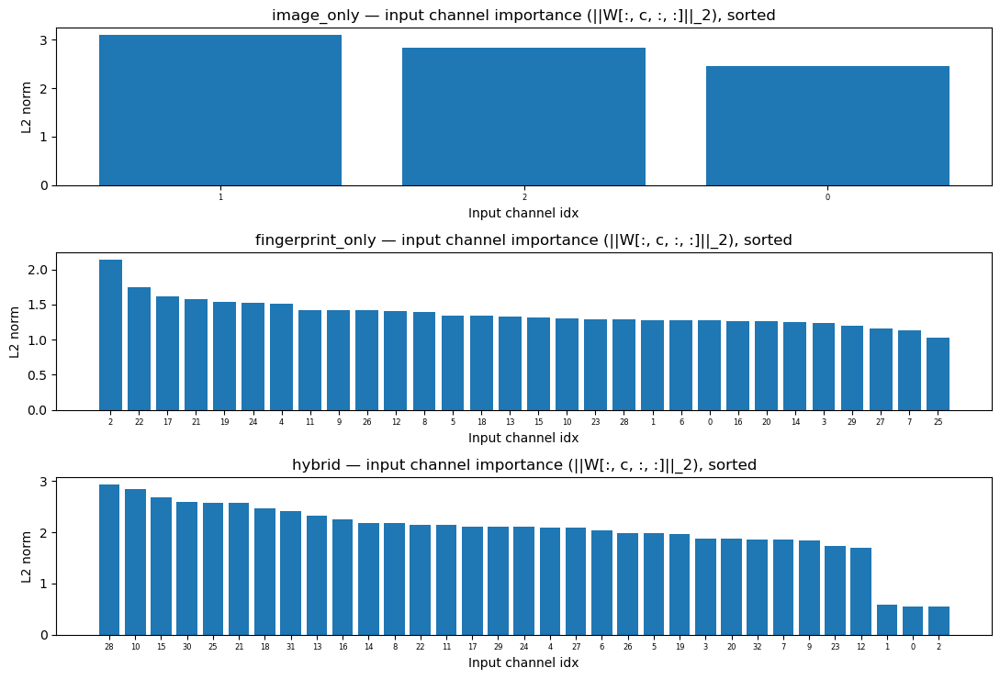

In [11]:
class ConvBNReLU(nn.Module):
    def __init__(self, in_c, out_c, k=3, s=1, p=1):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_c, out_c, k, s, p, bias=False),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True),
        )
    def forward(self, x): return self.block(x)


class PatchCraftClassifier(nn.Module):
    def __init__(self, in_channels=30, feat=32, num_classes=1):
        super().__init__()
        self.features = nn.Sequential(
            ConvBNReLU(in_channels, feat),
            ConvBNReLU(feat, feat), ConvBNReLU(feat, feat), ConvBNReLU(feat, feat),
            nn.AvgPool2d(2, 2),
            ConvBNReLU(feat, feat), ConvBNReLU(feat, feat),
            nn.AvgPool2d(2, 2),
            ConvBNReLU(feat, feat), ConvBNReLU(feat, feat),
            nn.AvgPool2d(2, 2),
            ConvBNReLU(feat, feat), ConvBNReLU(feat, feat),
            nn.AdaptiveAvgPool2d((1, 1)),
        )
        self.classifier = nn.Linear(feat, num_classes)

    def forward(self, x):
        x = self.features(x); x = torch.flatten(x, 1); return self.classifier(x).squeeze(1)


def load_classifier(mode, epoch=-1):
    """Load the PatchCraftClassifier checkpoint for `mode` at the given epoch (default: last)."""
    if mode not in CHECKPOINTS:
        raise FileNotFoundError(f"No checkpoints for mode {mode!r}")
    ckpt = CHECKPOINTS[mode][epoch]
    in_c = MODE_IN_CHANNELS[mode]
    model = PatchCraftClassifier(in_channels=in_c).to(DEVICE)
    model.load_state_dict(torch.load(ckpt, map_location=DEVICE))
    model.eval()
    return model, ckpt


def input_channel_importance(model):
    """L2 norm of first-conv weights per input channel."""
    w = model.features[0].block[0].weight.detach().cpu()   # [out, in, kH, kW]
    return w.pow(2).sum(dim=(0, 2, 3)).sqrt().numpy()      # [in]


# Load last-epoch classifiers for every mode we have
classifiers = {}
importances = {}
for mode in CHECKPOINTS:
    model, ckpt = load_classifier(mode)
    classifiers[mode] = model
    importances[mode] = input_channel_importance(model)


# Per-mode bar charts of input importance
fig, axes = plt.subplots(len(importances), 1, figsize=(11, 2.5 * len(importances)))
if len(importances) == 1:
    axes = [axes]
for ax, (mode, imp) in zip(axes, importances.items()):
    order = np.argsort(-imp)
    ax.bar(range(len(imp)), imp[order])
    ax.set_xticks(range(len(imp)))
    ax.set_xticklabels(order, fontsize=6)
    ax.set_title(f"{mode} — input channel importance (||W[:, c, :, :]||_2), sorted")
    ax.set_xlabel("Input channel idx")
    ax.set_ylabel("L2 norm")
plt.tight_layout(); plt.show()

## How Does Attention Develop Over Training?

Knowing that the fingerprint-aware models concentrate on a small subset of filters raises the next question: does that subset emerge slowly across training, or is it set early on? The heatmaps below answer that question for both fingerprint-only and hybrid. Each row of the plot is one training epoch, each column is one of the 30 SRM channels, and brighter cells mean the model is paying more attention to that filter at that point in training.

The pattern is basically the same in both modes: attention settles into its final shape within the first few epochs and stays largely stable for the rest of training. The model is not slowly discovering useful filters one by one — it commits to a subset early and only refines from there. This lines up with our previous analysis. We observed that the two fingerprint models took less iterations to perform classification well than the ResNet model. Here, we see that this is because they quickly determined which features correlated with real vs AI-generated images.

C:\Users\jerem\AppData\Local\Temp\ipykernel_28968\1473482379.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  m.load_state_dict(torch.load(p, map_location="cpu"))


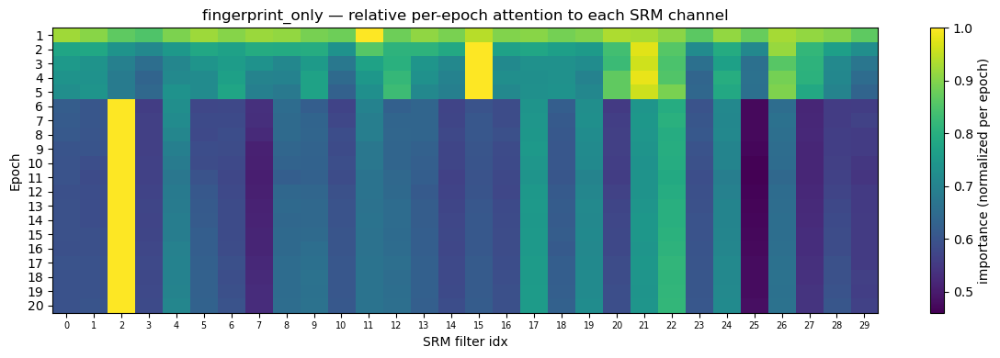

C:\Users\jerem\AppData\Local\Temp\ipykernel_28968\1473482379.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  m.load_state_dict(torch.load(p, map_location="cpu"))


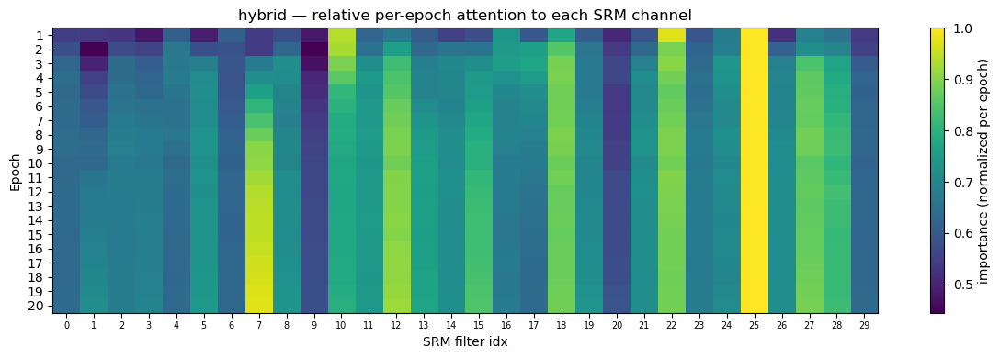

In [13]:
def importance_over_epochs(mode):
    """Return array of shape [num_epochs, num_input_channels] with per-epoch importances."""
    eps = CHECKPOINTS[mode]
    in_c = MODE_IN_CHANNELS[mode]
    rows = []
    for p in eps:
        m = PatchCraftClassifier(in_channels=in_c)
        m.load_state_dict(torch.load(p, map_location="cpu"))
        rows.append(input_channel_importance(m))
    return np.stack(rows), [int(p.stem.split("_")[1]) for p in eps]


for mode in [m for m in ("fingerprint_only", "hybrid") if m in CHECKPOINTS]:
    mat, epoch_nums = importance_over_epochs(mode)
    # For hybrid, drop RGB rows so all 30 columns are SRM
    if mode == "hybrid":
        mat = mat[:, 3:]
    # normalize each row so the heatmap shows relative attention within that epoch
    mat_norm = mat / mat.max(axis=1, keepdims=True)

    fig, ax = plt.subplots(figsize=(12, 4))
    im = ax.imshow(mat_norm, aspect="auto", cmap="viridis")
    ax.set_yticks(range(len(epoch_nums)))
    ax.set_yticklabels(epoch_nums)
    ax.set_xticks(range(30))
    ax.set_xticklabels(range(30), fontsize=7)
    ax.set_xlabel("SRM filter idx")
    ax.set_ylabel("Epoch")
    ax.set_title(f"{mode} — relative per-epoch attention to each SRM channel")
    plt.colorbar(im, ax=ax, label="importance (normalized per epoch)")
    plt.tight_layout(); plt.show()

## Layer-by-Layer Activations

Up until this point we have only really been looking at the inputs the classifier receives. It is also worth seeing what those inputs turn into as they move through the network. The grids below show the most-activated channels at each stage of the classifier, for each of our three models, on a real and a fake image.

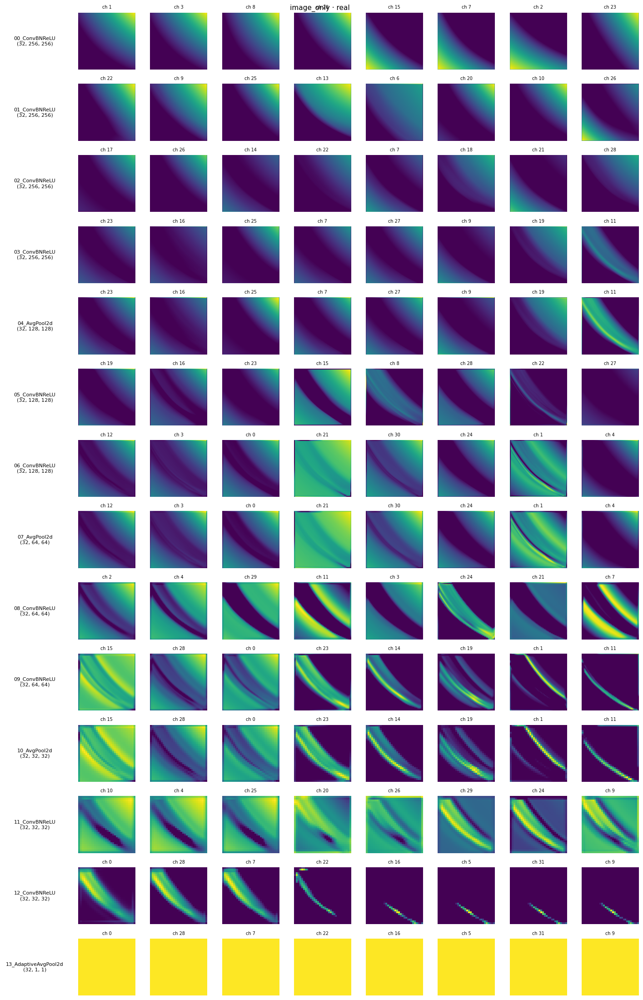

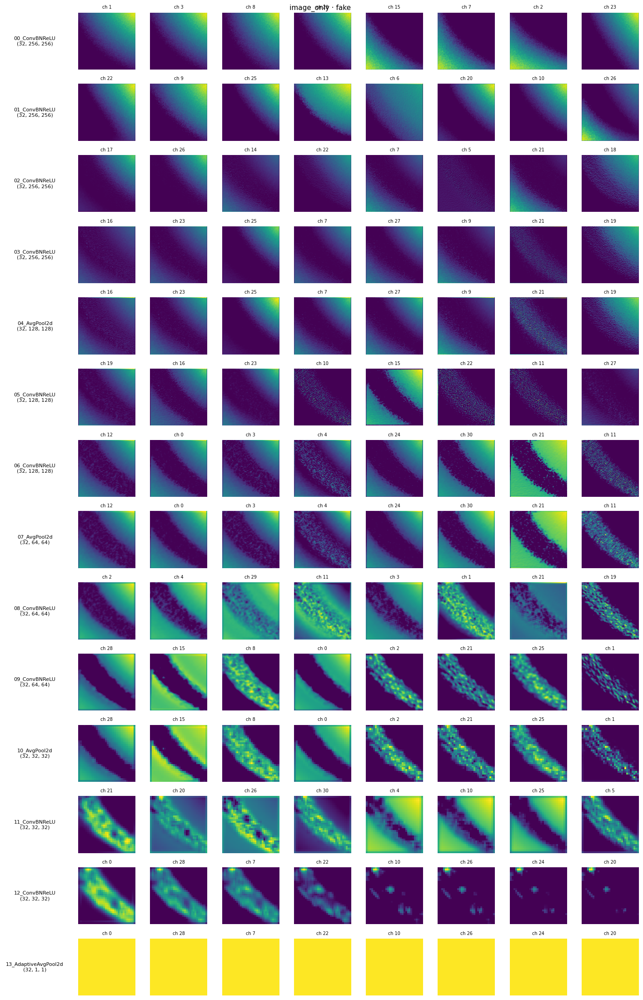

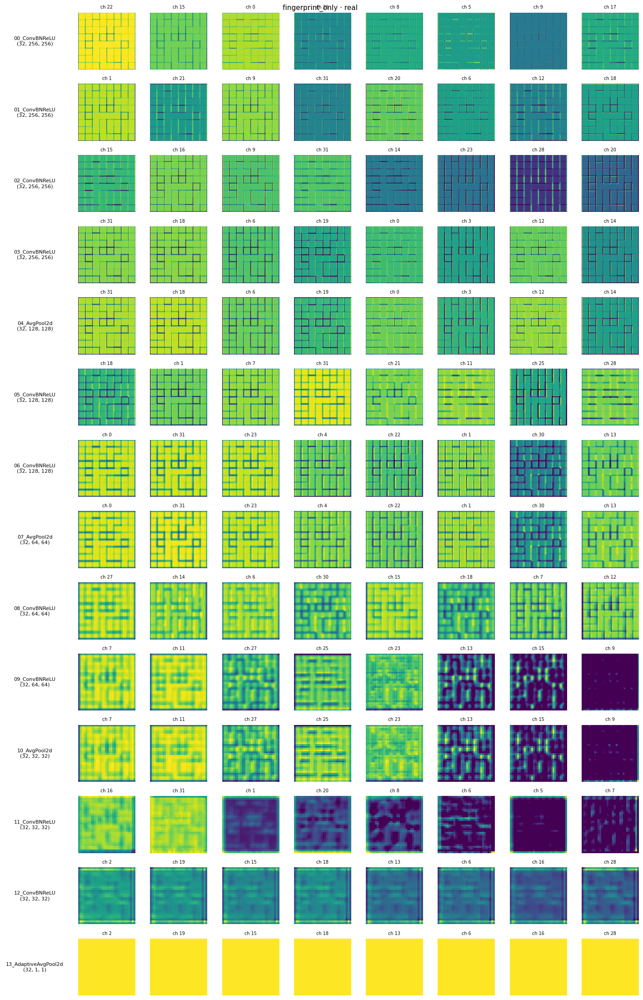

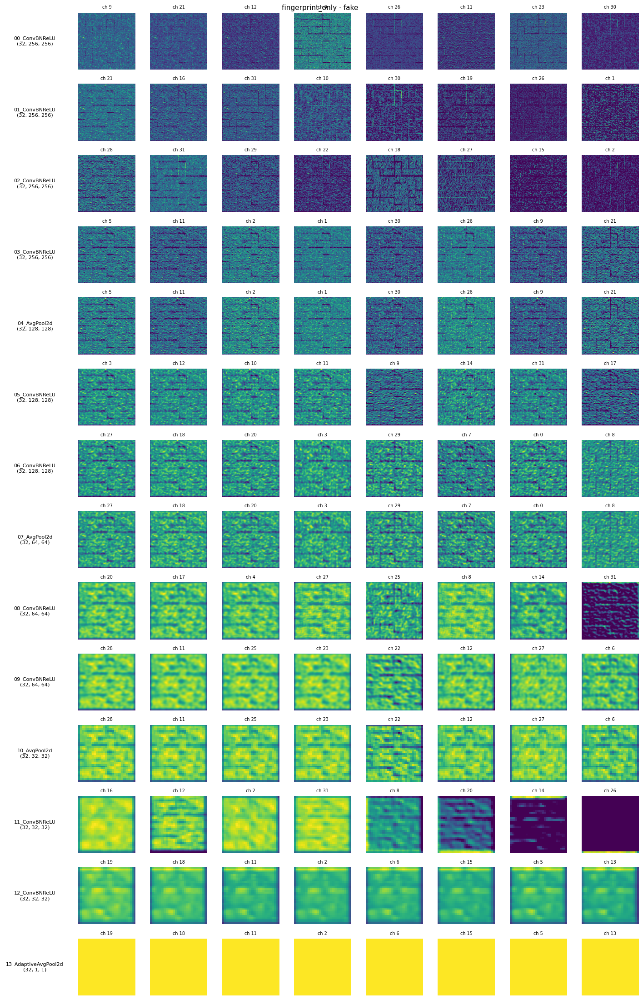

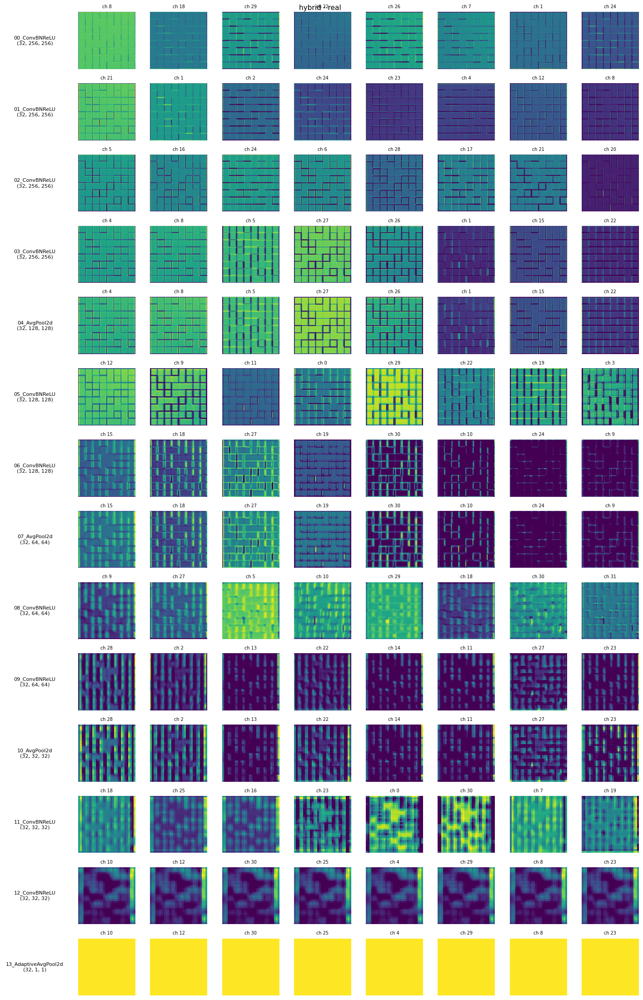

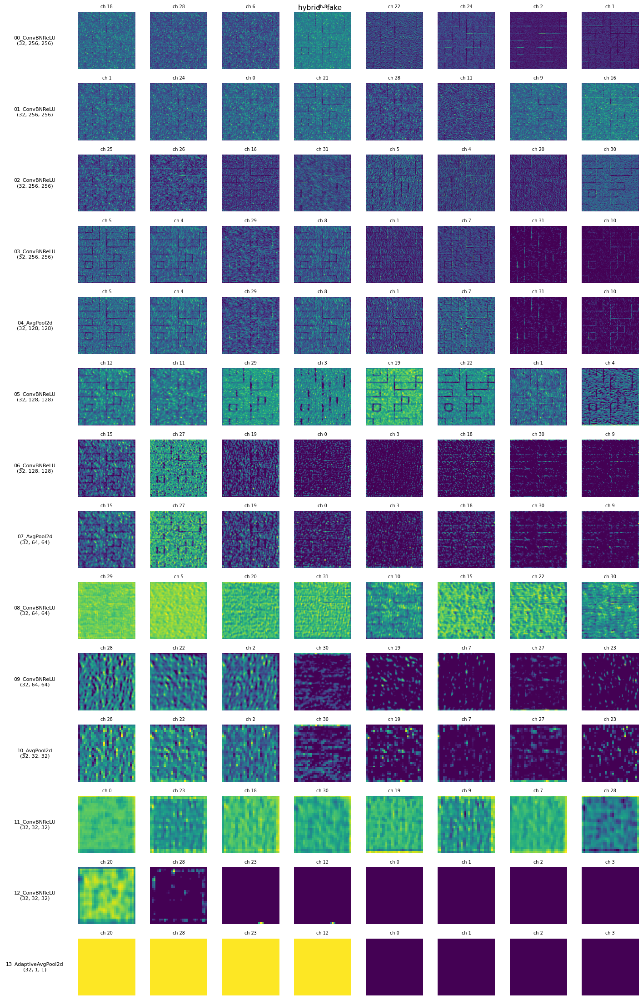

In [16]:
def prepare_input(img_rgb, mode):
    """img_rgb: [1, 3, H, W] in [0, 1]. Returns tensor shaped as classifier expects.

    For fingerprint_only and hybrid, this mirrors notebook.ipynb's preprocess_batch:
    smash -> reconstruct -> SRM on rich and poor collages, then |rich_res - poor_res|.
    """
    if mode == "image_only":
        return img_rgb

    rich_c, poor_c = smash_and_reconstruct(img_rgb)
    rich_res = fixed_filters(rich_c)            # [1, 30, H, W]
    poor_res = fixed_filters(poor_c)            # [1, 30, H, W]
    fingerprint = (rich_res - poor_res).abs()   # [1, 30, H, W]

    if mode == "fingerprint_only":
        return fingerprint
    if mode == "hybrid":
        return torch.cat([img_rgb, fingerprint], dim=1)
    raise ValueError(mode)


def forward_with_activations(model, x):
    """Run a forward pass while capturing every child output of model.features."""
    acts = {}
    hooks = []
    for i, mod in enumerate(model.features):
        name = f"{i:02d}_{type(mod).__name__}"
        hooks.append(mod.register_forward_hook(
            lambda m, inp, out, n=name: acts.__setitem__(n, out.detach().cpu())
        ))
    try:
        with torch.no_grad():
            model(x)
    finally:
        for h in hooks:
            h.remove()
    return acts


def plot_activation_grid(acts, k_channels=8, title=""):
    layers = list(acts.items())
    fig, axes = plt.subplots(len(layers), k_channels + 1,
                             figsize=((k_channels + 1) * 1.6, len(layers) * 1.6))
    if len(layers) == 1:
        axes = axes[None, :]
    for row, (name, a) in enumerate(layers):
        a = a[0]
        importance = a.abs().mean(dim=(1, 2))
        top = torch.argsort(importance, descending=True)[:k_channels]
        axes[row, 0].text(0.5, 0.5, f"{name}\n{tuple(a.shape)}",
                          ha="center", va="center", fontsize=8,
                          transform=axes[row, 0].transAxes)
        axes[row, 0].axis("off")
        for col, ch in enumerate(top, start=1):
            m = a[ch].numpy()
            v = max(abs(m.min()), abs(m.max()), 1e-6)
            axes[row, col].imshow(m, cmap="viridis", vmin=0, vmax=v)
            axes[row, col].set_title(f"ch {int(ch)}", fontsize=7)
            axes[row, col].axis("off")
        for col in range(len(top) + 1, k_channels + 1):
            axes[row, col].axis("off")
    fig.suptitle(title, fontsize=11)
    plt.tight_layout(); plt.show()


# Visualize every trained mode: image_only (vanilla CNN), fingerprint_only, hybrid
for mode in classifiers:
    model = classifiers[mode]
    for label, img in [("real", real_img), ("fake", fake_img)]:
        x = prepare_input(img, mode).to(DEVICE)
        acts = forward_with_activations(model, x)
        plot_activation_grid(acts, k_channels=8, title=f"{mode} · {label}")